### Визуализация сверточных нейронных сетей
Эта тетрадь сосредоточена вокруг визуализации convnet. Будет визуализировано следующее:

- Выходы Convnet из промежуточных активаций
- Фильтры Convnet
- тепловые карты активации класса

### Визуализация Промежуточных Активаций
Промежуточные активации будут визуализироваться путем вывода 3D-фильтров (карт объектов) сверточного слоя. Каждый фильтр состоит из 3 каналов для изображения RGB, поэтому каждый канал будет отображаться как 2D-изображение.

In [1]:
from tensorflow.keras import models
from keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Using TensorFlow backend.


In [2]:
model = models.load_model('cats_and_dogs_small_1.h5')
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_11 (Conv2D)           (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_12 (Conv2D)           (None, 15, 15, 128)      

In [3]:
# Preprocess a chosen test image
base_dir='dogs_cats_sample_5000'
img_path = base_dir + '/valid/cats/cat.176.jpg'
img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0) # 3D ~> 4D tensor
img_tensor = img_tensor/255 #Та же самая предварительная обработка выполняется во время обучения модели

print(img_tensor.shape)

(1, 150, 150, 3)


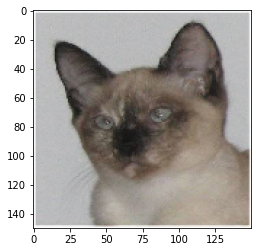

In [4]:
# Display selected image
plt.imshow(img_tensor[0])
plt.show()

Для вывода активаций всех сверточных и объединяющих слоев мы будем использовать класс моделей Keras, который допускает несколько выходов.

In [5]:
# Модель принимает один входной тензор, выводит список выходных тензоров
layer_outputs = [layer.output for layer in model.layers[:8]] # Первые 8 слоёв
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


Мы видим, что первый слой выводит карту признаков размером 148 x 148 с 32 фильтрами / выходными каналами.

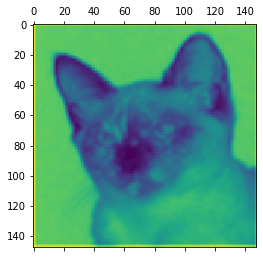

In [6]:
# Визуализация 16-го выходного канала 1-го слоя
plt.matshow(first_layer_activation[0,:,:,9], cmap='viridis');

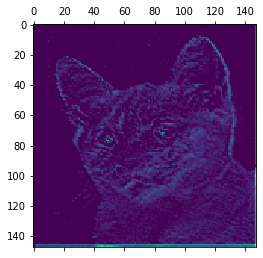

In [7]:
# Визуализация 24-го выходного канала 1-го слоя
plt.matshow(first_layer_activation[0,:,:,24], cmap='viridis');

Этот канал, по-видимому, обнаруживает диагональные края.

/home/artem/.local/lib/python3.6/site-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


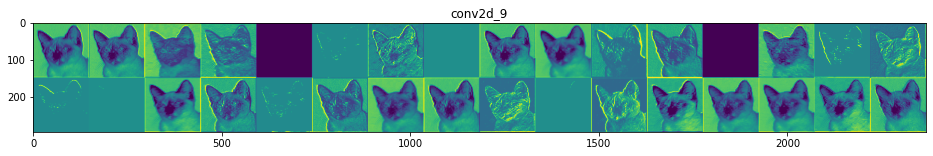

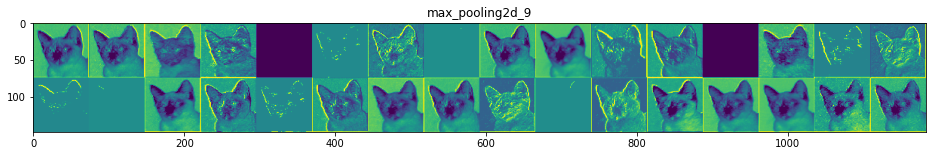

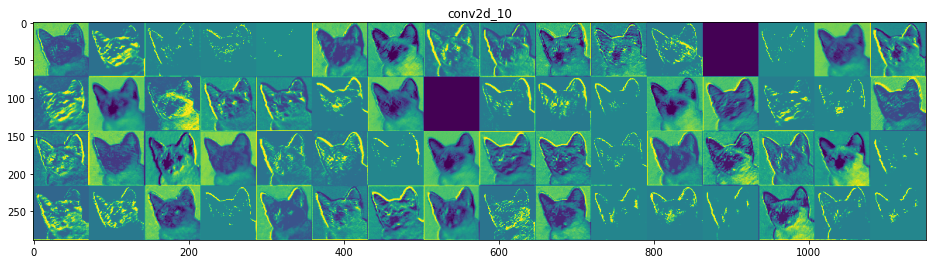

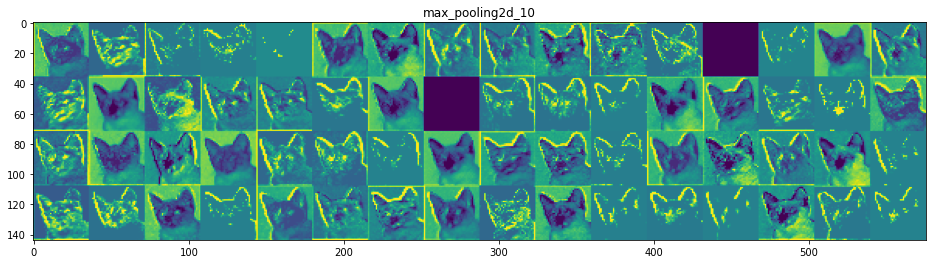

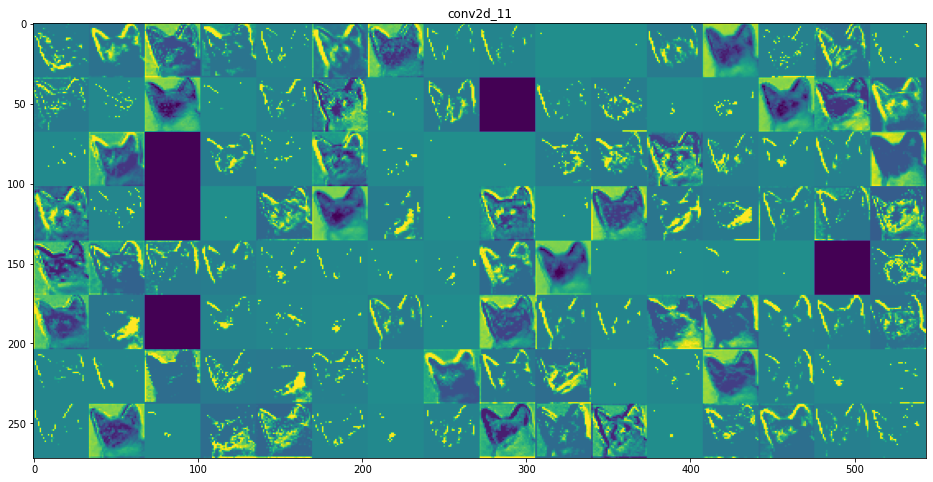

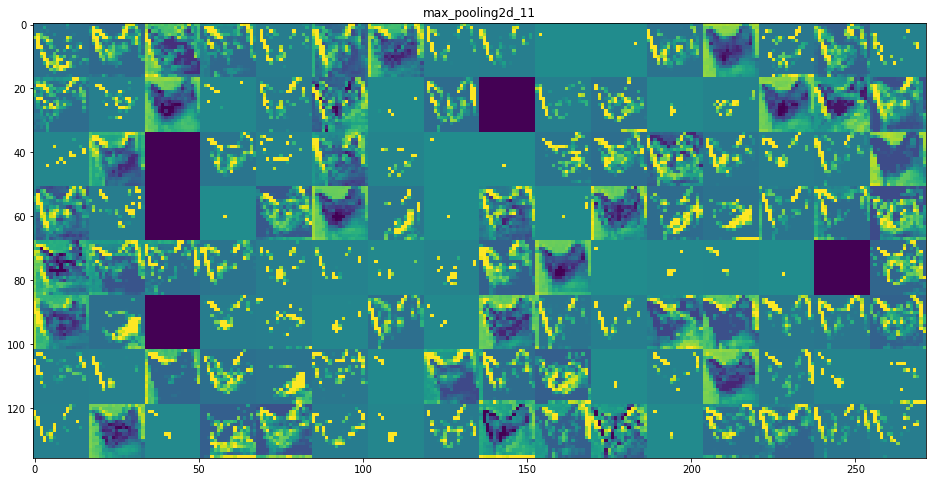

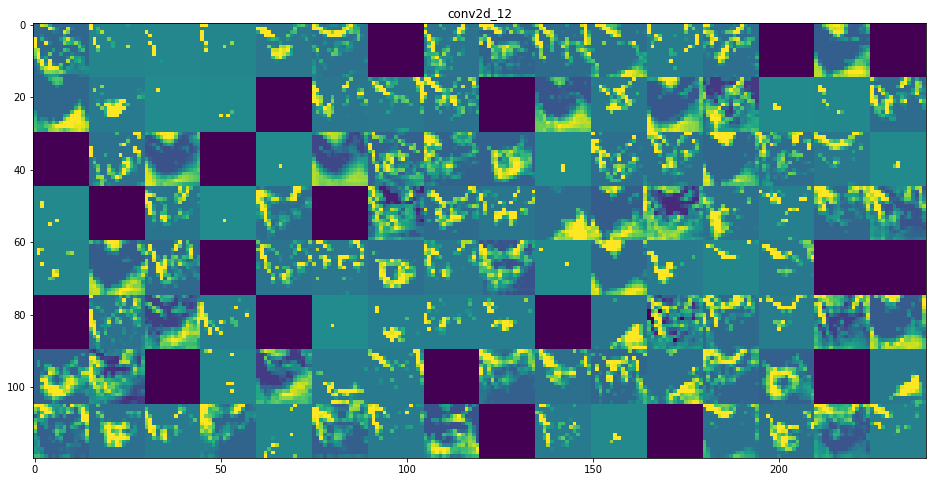

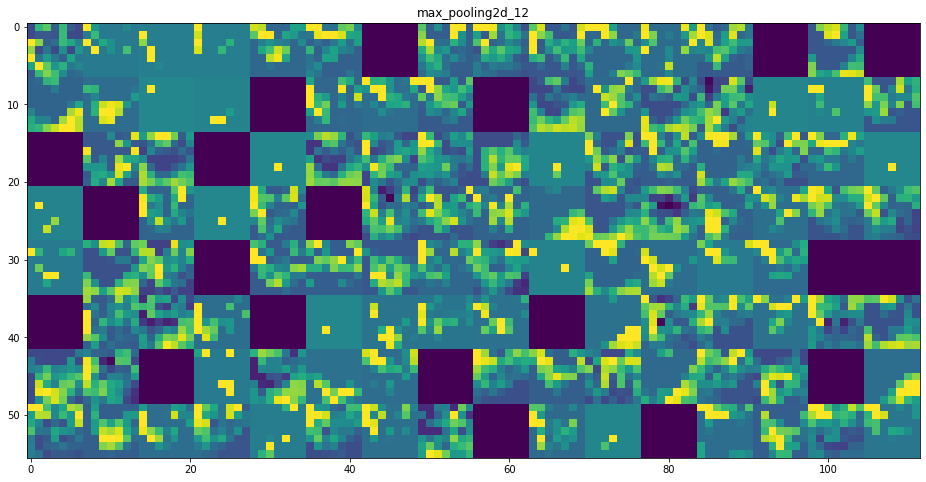

In [29]:
# Визуализация каждого выходного канала активации каждого слоя
layer_names = [layer.name for layer in model.layers[:8]]
images_per_row=16

for layer_name, layer_activation in zip(layer_names, activations):
    n_features = layer_activation.shape[-1]
    size = layer_activation.shape[1]

    n_cols = n_features // images_per_row
    display_grid = np.zeros((size*n_cols, images_per_row*size))

    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,:,:,col*images_per_row + row]
            # Post-process img values
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image = 64*channel_image + 128
            # Limit rescaled image values to valid pixel vals
            channel_image = np.clip(channel_image, 0 , 255).astype('uint8')
            display_grid[col*size : (col+1)*size,
                       row*size : (row+1)*size] = channel_image

    scale = 1/size
    plt.figure(figsize=(scale * display_grid.shape[1],
                      scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

Первый слой действует как набор различных краевых детекторов.
На этом этапе активации все еще сохраняют почти всю информацию, присутствующую в исходной картине.

По мере того как мы поднимаемся выше, эти активации становятся все более абстрактными и менее поддающимися визуальной интерпретации. Они начинают кодировать признаки более высокого уровня, такие как "кошачье ухо" или "кошачий глаз". Более высокие признаки несут все меньше информации о визуальном содержании изображения и все больше информации, связанной с классом изображения.
Разреженность активаций увеличивается с глубиной слоя: в первом слое все фильтры активируются входным изображением, но в последующих слоях все больше и больше фильтров остаются пустыми. Это означает, что шаблон, закодированный фильтром, не найден во входном изображении.

Мы только что показали очень важную универсальную характеристику признаков, изучаемых глубокими нейронными сетями: особенности, извлеченные слоем, становятся все более абстрактными с глубиной слоя. Активация более высоких слоев несет все меньше и меньше информации о видимом конкретном входе и все больше и больше информации о цели (в нашем случае о классе изображения: кошка или собака). Глубокая нейронная сеть эффективно действует как конвейер перегонки информации, в который поступают необработанные данные (в нашем случае изображения RBG) и многократно преобразуются таким образом, что нерелевантная информация фильтруется (например, конкретный визуальный вид изображения), а полезная информация увеличивается и уточняется (например, класс изображения).

Это аналогично тому, как люди и животные воспринимают мир: понаблюдав за сценой в течение нескольких секунд, человек может вспомнить, какие абстрактные объекты присутствовали в ней (например, велосипед, дерево), но не может вспомнить конкретный внешний вид этих объектов. На самом деле, если вы попытаетесь нарисовать общий велосипед из ума прямо сейчас, скорее всего, вы не сможете получить его даже отдаленно правильно, даже если вы видели тысячи велосипедов в своей жизни. Попробуйте прямо сейчас: этот эффект абсолютно реален. Ваш мозг научился полностью абстрагировать свой визуальный вход, трансформировать его в высокоуровневые визуальные концепции, полностью отфильтровывая несущественные визуальные детали, что чрезвычайно затрудняет запоминание того, как на самом деле выглядят окружающие нас вещи.

### Визуализация Фильтров Convnet
Чтобы визуализировать фильтр CNN, мы будем использовать градиентный спуск для обновления значения входного изображения, чтобы максимизировать отклик фильтра (начиная с пустого изображения). Мы будем использовать предварительно подготовленную модель VGG16 в качестве нашего CNN.

Чтобы отобразить визуальный паттерн, на который должен реагировать каждый фильтр. Это может быть сделано с помощью градиентного подъема во входном пространстве: применение градиентного спуска к значению входного изображения convnet таким образом, чтобы максимизировать отклик конкретного фильтра, начиная с пустого входного изображения. Результирующее входное изображение будет таким, на которое выбранный фильтр максимально реагирует.

Процесс прост: мы построим функцию потерь, которая максимизирует значение данного фильтра в данном слое свертки, а затем будем использовать…


In [8]:
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet',include_top=False)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


In [9]:
# Вспомогательная функция для масштабирования значений тензора до допустимых значений пикселя img
def postprocess_image(x):
    x -= x.mean()             # центрирование по 0
    x /= x.std() + 1e-5       # Standardize
    x *= 0.1                  # Rescale
    x += 0.5                  # центрирование по 0.5
    x = np.clip(x, 0, 1)      # ограничение максимальных и минимальных значений пикселей
    x *= 255
    x = np.clip(x, 0, 255).astype(np.uint8) 
    return x

In [10]:
# Генерация визуализаций фильтров
def generate_pattern(layer_name, filter_index, size=150):
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Gradient( loss ) 
    grads = K.gradients(loss, model.input)[0]

    # Нормализовать градиент по L2 для гладких численных вычислений
    grads /= K.sqrt(K.mean(K.square(grads))) + 1e-5

    # Функция для вывода loss and grad
    iterate = K.function([model.input], [loss, grads])

    # Случайный старт
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128

    # Стохастический градусный спуск для максимизации потерь
    alpha = 1   # скорость обучения
    n_steps = 40 

    for i in range(n_steps):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data = input_img_data + grads_value*alpha

        img = input_img_data[0]
    return postprocess_image(img)

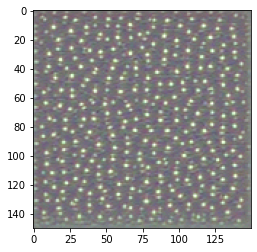

In [11]:
plt.imshow(generate_pattern('block3_conv1', 0));

Похоже, что фильтр 0 в слое block3_conv1 реагирует на узор в горошек.

Теперь самое интересное: мы можем начать визуализировать каждый отдельный фильтр в каждом слое. Для простоты мы рассмотрим только первые 64 фильтра в каждом слое и только первый слой каждого блока свертки (block1_conv1, block2_conv1, block3_conv1, block4_conv1, block5_conv1). Мы расположим выходные данные на сетке 8x8 из 64x64 шаблонов фильтров, с некоторыми черными полями между каждым шаблоном фильтра.

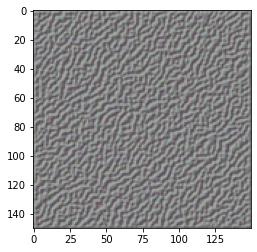

In [35]:
plt.imshow(generate_pattern('block1_conv1', 0));

In [26]:
# Генерация сетки - модели отклика фильтра для заданного слоя
def plot_layer_filter_responses(layer_name):
    size=64
    margin=5
    results = np.zeros((8*size + 7*margin, 8*size + 7*margin, 3))

    for i in range(8):
        for j in range(8):
            filter_img = generate_pattern(layer_name, i+(j*8), size=size)
            horizontal_start = i*size + i*margin
            horizontal_end = horizontal_start + size
            vertical_start = j*size + j*margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end,
                    vertical_start: vertical_end, :] = filter_img

    plt.figure(figsize=(15, 15))
    plt.title(layer_name)
    plt.imshow(results.astype(np.uint8))

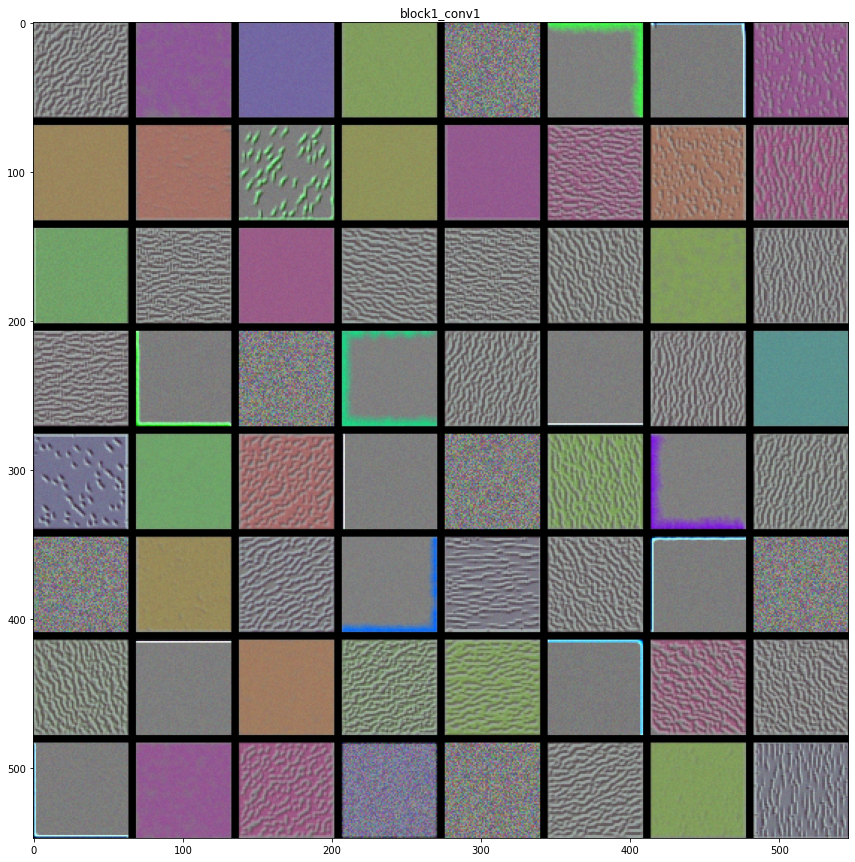

In [37]:
plot_layer_filter_responses('block1_conv1')

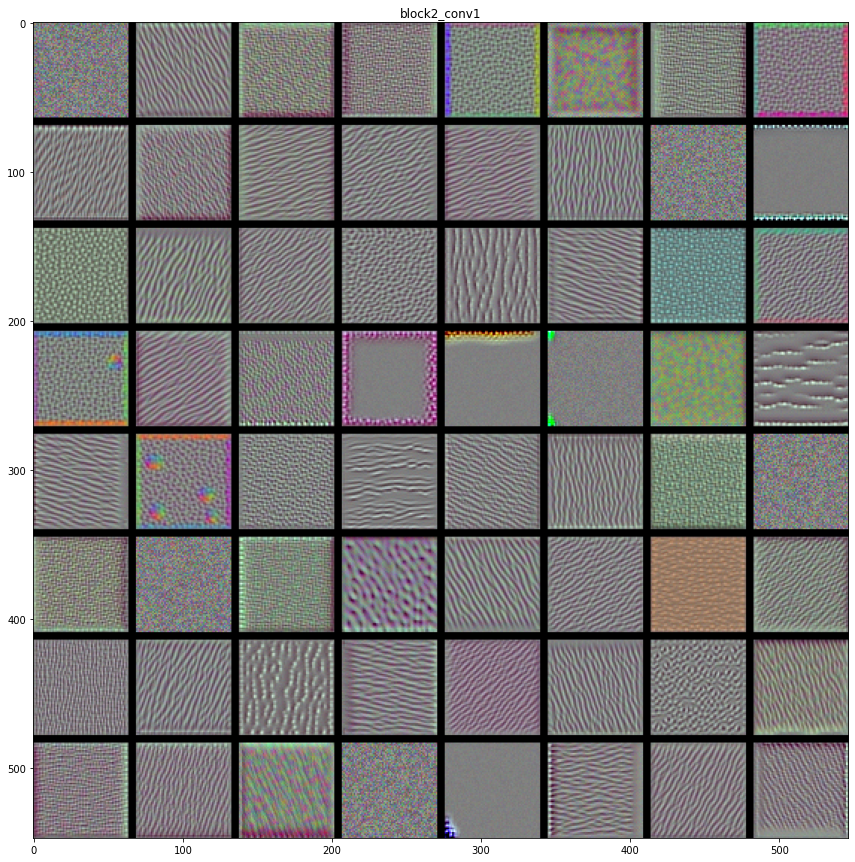

In [38]:
plot_layer_filter_responses('block2_conv1')

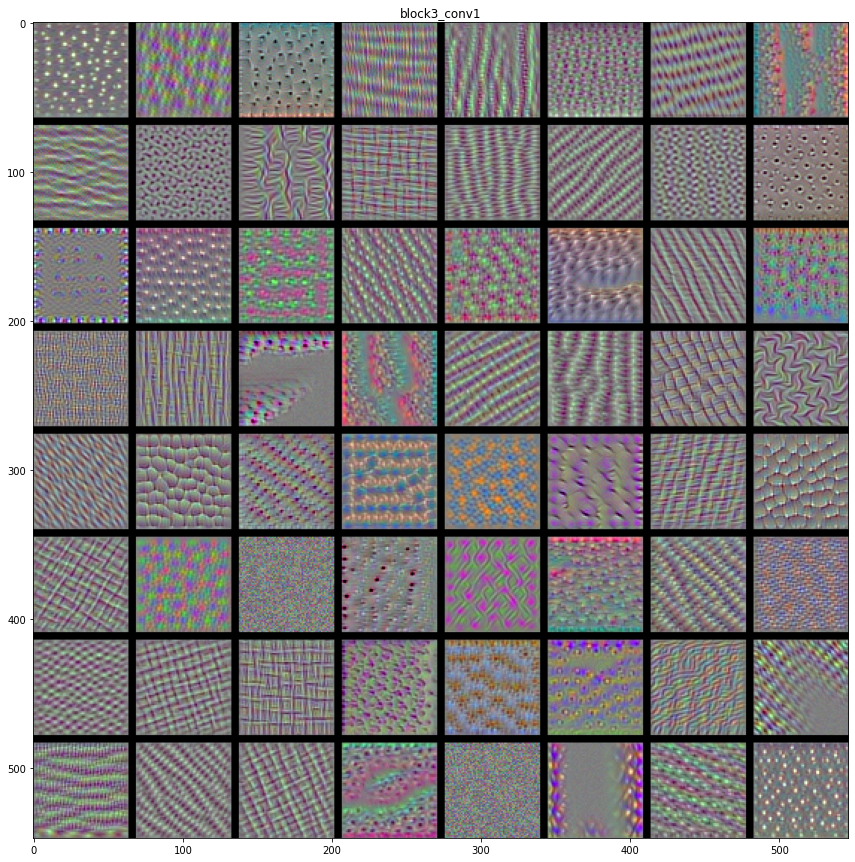

In [39]:
plot_layer_filter_responses('block3_conv1')

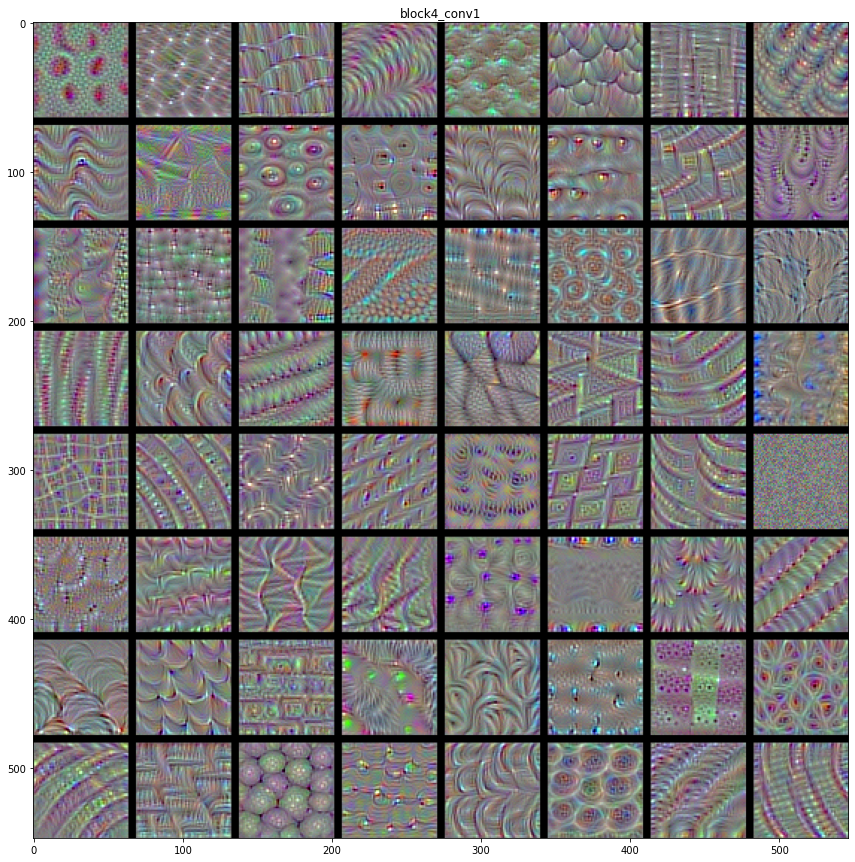

In [40]:
plot_layer_filter_responses('block4_conv1')

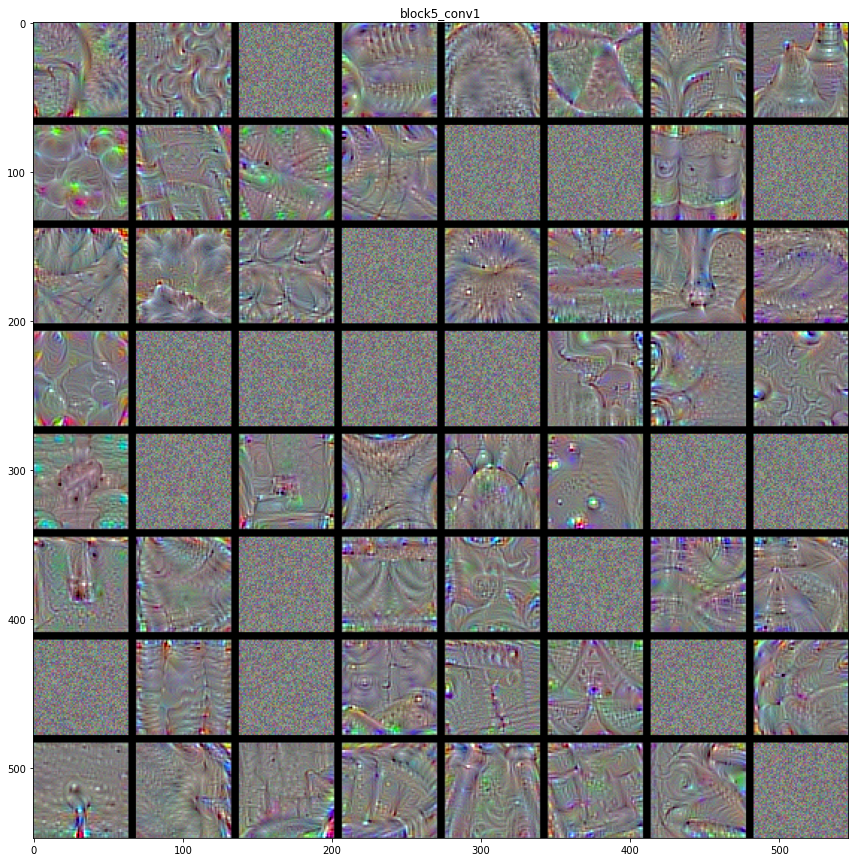

In [41]:
plot_layer_filter_responses('block5_conv1')

Эти визуализации фильтров многое говорят нам о том, как слои convnet видят мир: каждый слой в convnet просто изучает набор фильтров, так что их входные данные могут быть выражены в виде комбинации фильтров. Это похоже на то, как преобразование Фурье разлагает сигналы в косинусных функции. Фильтры convnet становятся все более сложными и утонченными по мере того, как мы поднимаемся выше в модели:

- Фильтры из первого слоя модели (блок 1_conv 1) кодируют простые направленные ребра и цвета (или цветные ребра в некоторых случаях).
- Фильтры из блока 2_conv1 кодируют простые текстуры, сделанные из комбинаций краев и цветов.
- Фильтры в более высоких слоях начинают напоминать текстуры, найденные в естественных изображениях: перья, глаза, листья и т.д.

## Визуализация тепловых карт активации класса
Чтобы визуализировать  "Class Activation Map" (CAM), мы создадим двумерную сетку оценок по входному изображению. Баллы показывают, насколько важен этот регион для определения класса интересов. Еще раз мы будем использовать предварительно подготовленную модель VGG16 CNN.

Мы введем еще один метод визуализации, который полезен для понимания того, какие части данного изображения привели convnet к его окончательному классификационному решению. Это полезно для "отладки" процесса принятия решений в сети convnet,в частности в случае ошибки классификации. Он также позволяет находить определенные объекты на изображении.

Эта общая категория методов называется визуализацией  "Class Activation Map" (CAM) и заключается в создании тепловых карт `активации класса` по входным изображениям. Тепловая карта `активации класса` - это двумерная сетка оценок, связанных с определенным выходным классом, вычисленная для каждого местоположения в любом входном изображении, указывающая, насколько важно каждое местоположение по отношению к рассматриваемому классу. Например, дано изображение, которое подается в один из наших convnet, визуализация карты активации класса позволяет нам генерировать тепловую карту для класса Котов, указывающую, насколько кошачьи разные части изображения, а также для класса Собаки, указывающего, насколько собачьи разные части изображения.

Конкретная реализация, которую мы будем использовать, описана в (Grad-CAM)[https://arxiv.org/abs/1610.02391]. Это очень просто: он состоит в том, чтобы взять выходную карту объектов слоя свертки, заданного входным изображением, и взвесить каждый канал в этой карте объектов по градиенту класса относительно канала. Интуитивно, один из способов понять этот трюк заключается в том, что мы взвешиваем пространственную карту "насколько интенсивно входное изображение активирует различные каналы" на "насколько важен каждый канал по отношению к классу", в результате чего получается пространственная карта "насколько интенсивно входное изображение активирует класс".

Мы снова продемонстрируем эту технику, используя предварительно обученную сеть VGG16:

In [9]:
model = VGG16(weights='imagenet')

# Preprocess input image
img_path = base_dir + '/creative_commons_elephant.jpg'
img = image.load_img(img_path, target_size=(224, 224))
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

In [10]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n02504458', 'African_elephant', 0.909421), ('n01871265', 'tusker', 0.086182885), ('n02504013', 'Indian_elephant', 0.0043545826)]


Проверяя предсказание изображения, мы обнаруживаем, что модель считает, что это, скорее всего, Африканский слон с вероятностью 91%.

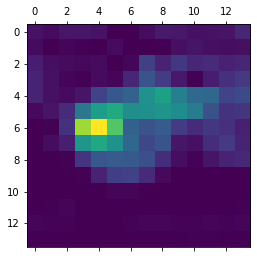

In [13]:
## CAM
predIndex = np.argmax(preds[0]) #  index для african elephant class

african_elephant_output = model.output[:, predIndex]
last_conv_layer = model.get_layer('block5_conv3')

grads = K.gradients(african_elephant_output, last_conv_layer.output)[0]
pooled_grads = K.mean(grads, axis=(0, 1, 2))
iterate = K.function([model.input],
                     [pooled_grads, last_conv_layer.output[0]])

pooled_grads_value, conv_layer_output_value = iterate([x])

# 512 выходных каналов, умножает выходную карту объектов на важность канала для прогнозирования
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

heatmap = np.mean(conv_layer_output_value, axis=-1) # среднее значение по каналам

# Значения тепловой карты после обработки должны быть в диапазоне от 0 до 1
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

С помощью созданной тепловой карты мы можем наложить ее на исходное изображение, чтобы определить, какие области изображения вносят наибольший вклад в предсказание класса "Африканский слон".

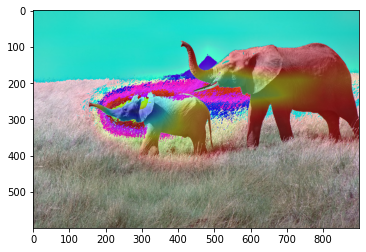

In [14]:
# Наложение CAM на оригинальное изображение
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = np.uint8(255 * heatmap)
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
superimposed_img = heatmap * 0.4 + img
plt.imshow(superimposed_img.astype(np.uint8))
plt.show()

Визуализация наложенной тепловой карты показывает, что нейронная сеть считает уши и хобот слонов важными признаками для классификации африканских слонов.